In [37]:
import tensorflow as tf
import pandas as pd
import numpy as np
from surrogate import rules

from utils.df_loader import load_adult_df, load_compas_df, load_german_df, load_diabetes_df, load_breast_cancer_df
from utils.preprocessing import preprocess_df
from sklearn.model_selection import train_test_split
from utils.dice import generate_dice_result, process_results
from utils.models import train_three_models, evaluation_test, save_three_models, load_three_models
from utils.save import save_result_as_csv
from IPython.display import Image
import PIL
import pydotplus
from six import StringIO
from sklearn.tree import export_graphviz
from pydotplus import *


pd.options.mode.chained_assignment = None 

print('TF version: ', tf.__version__)
print('Eager execution enabled: ', tf.executing_eagerly()) # False

seed = 123
tf.random.set_seed(seed)
np.random.seed(seed)


TF version:  2.0.0
Eager execution enabled:  True


In [38]:
def get_location(scaler, col):
    if col in scaler.feature_names_in_:
        return np.where(scaler.feature_names_in_ == col)[0]
    
    else:
        raise Exception(f"Column [{col}] not a feature in this scaler, scaler features: {scaler.feature_names_in_}")


def get_scaled_value(scaler, col, X):
    loc=get_location(scaler, col)

    X *= scaler.scale_[loc]
    X += scaler.min_[loc]

    if scaler.clip:
        np.clip(X, scaler.feature_range[0][loc], scaler.feature_range[1][loc], out=X)
    
    return X[0]


def get_original_value(scaler, col, X):
    loc = get_location(scaler, col)

    X -= scaler.min_[loc]
    X /= scaler.scale_[loc]

    return X[0]

In [39]:
#### Select dataset ####'

dataset_name = 'compas' # [adult, german, compas]

if dataset_name == 'adult':
    dataset_loading_fn = load_adult_df
elif dataset_name == 'german':
    dataset_loading_fn = load_german_df
elif dataset_name == 'compas':
    dataset_loading_fn = load_compas_df
elif dataset_name == 'diabetes':
    dataset_loading_fn = load_diabetes_df
elif dataset_name == 'breast_cancer':
    dataset_loading_fn = load_breast_cancer_df
else:
    raise Exception("Unsupported dataset")

In [40]:
#### Load datafram info.
df_info = preprocess_df(dataset_loading_fn)
### Seperate to train and test set.
train_df, test_df = train_test_split(df_info.dummy_df, train_size=.8, random_state=seed, shuffle=True)
### Get training and testing array.
X_train = np.array(train_df[df_info.ohe_feature_names])
y_train = np.array(train_df[df_info.target_name])
X_test = np.array(test_df[df_info.ohe_feature_names])
y_test = np.array(test_df[df_info.target_name])
### Load models.
models = load_three_models(X_train.shape[-1], dataset_name)

/Users/yu-liangchou/opt/anaconda3/envs/cf_2022_final/lib/python3.7/site-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 0.24.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
/Users/yu-liangchou/opt/anaconda3/envs/cf_2022_final/lib/python3.7/site-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator RandomForestClassifier from version 0.24.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,


In [41]:
#pip install pillow
#pip install dtreeviz
#pip install Graphviz
from dtreeviz.trees import *
from sklearn.tree import DecisionTreeClassifier
proto_dt = pd.read_csv(r'./datasets/eval_proto_compas_dt_result.csv')


In [42]:
original_compas = pd.read_csv(r'./datasets/COMPAS.csv')
original_compas

,id,name,first,last,compas_screening_date,sex,dob,age,age_cat,race,...,v_decile_score,v_score_text,v_screening_date,in_custody,out_custody,priors_count.1,start,end,event,two_year_recid
0,1,miguel hernandez,miguel,hernandez,2013-08-14,Male,1947-04-18,69,Greater than 45,Other,...,1,Low,2013-08-14,2014-07-07,2014-07-14,0,0,327,0,0
1,3,kevon dixon,kevon,dixon,2013-01-27,Male,1982-01-22,34,25 - 45,African-American,...,1,Low,2013-01-27,2013-01-26,2013-02-05,0,9,159,1,1
2,4,ed philo,ed,philo,2013-04-14,Male,1991-05-14,24,Less than 25,African-American,...,3,Low,2013-04-14,2013-06-16,2013-06-16,4,0,63,0,1
3,5,marcu brown,marcu,brown,2013-01-13,Male,1993-01-21,23,Less than 25,African-American,...,6,Medium,2013-01-13,NaN,NaN,1,0,1174,0,0
4,6,bouthy pierrelouis,bouthy,pierrelouis,2013-03-26,Male,1973-01-22,43,25 - 45,Other,...,1,Low,2013-03-26,NaN,NaN,2,0,1102,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7209,10996,steven butler,steven,butler,2013-11-23,Male,1992-07-17,23,Less than 25,African-American,...,5,Medium,2013-11-23,2013-11-22,2013-11-24,0,1,860,0,0
7210,10997,malcolm simmons,malcolm,simmons,2014-02-01,Male,1993-03-25,23,Less than 25,African-American,...,5,Medium,2014-02-01,2014-01-31,2014-02-02,0,1,790,0,0
7211,10999,winston gregory,winston,gregory,2014-01-14,Male,1958-10-01,57,Greater than 45,Other,...,1,Low,2014-01-14,2014-01-13,2014-01-14,0,0,808,0,0
7212,11000,farrah jean,farrah,jean,2014-03-09,Female,1982-11-17,33,25 - 45,African-American,...,2,Low,2014-03-09,2014-03-08,2014-03-09,3,0,754,0,0


In [43]:
original_compas

,id,name,first,last,compas_screening_date,sex,dob,age,age_cat,race,...,v_decile_score,v_score_text,v_screening_date,in_custody,out_custody,priors_count.1,start,end,event,two_year_recid
0,1,miguel hernandez,miguel,hernandez,2013-08-14,Male,1947-04-18,69,Greater than 45,Other,...,1,Low,2013-08-14,2014-07-07,2014-07-14,0,0,327,0,0
1,3,kevon dixon,kevon,dixon,2013-01-27,Male,1982-01-22,34,25 - 45,African-American,...,1,Low,2013-01-27,2013-01-26,2013-02-05,0,9,159,1,1
2,4,ed philo,ed,philo,2013-04-14,Male,1991-05-14,24,Less than 25,African-American,...,3,Low,2013-04-14,2013-06-16,2013-06-16,4,0,63,0,1
3,5,marcu brown,marcu,brown,2013-01-13,Male,1993-01-21,23,Less than 25,African-American,...,6,Medium,2013-01-13,NaN,NaN,1,0,1174,0,0
4,6,bouthy pierrelouis,bouthy,pierrelouis,2013-03-26,Male,1973-01-22,43,25 - 45,Other,...,1,Low,2013-03-26,NaN,NaN,2,0,1102,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7209,10996,steven butler,steven,butler,2013-11-23,Male,1992-07-17,23,Less than 25,African-American,...,5,Medium,2013-11-23,2013-11-22,2013-11-24,0,1,860,0,0
7210,10997,malcolm simmons,malcolm,simmons,2014-02-01,Male,1993-03-25,23,Less than 25,African-American,...,5,Medium,2014-02-01,2014-01-31,2014-02-02,0,1,790,0,0
7211,10999,winston gregory,winston,gregory,2014-01-14,Male,1958-10-01,57,Greater than 45,Other,...,1,Low,2014-01-14,2014-01-13,2014-01-14,0,0,808,0,0
7212,11000,farrah jean,farrah,jean,2014-03-09,Female,1982-11-17,33,25 - 45,African-American,...,2,Low,2014-03-09,2014-03-08,2014-03-09,3,0,754,0,0


In [44]:

# VISUALISE_DECISION_TREE_PATH
# 
def visualize_decision_tree_path( clf, graph, instance, indx, exp_type, path ):  

  for i, node in enumerate(graph.get_node_list()):
    if node.get_attributes().get('label') is None:
        continue

    if 'samples = ' in node.get_attributes()['label']:
        labels = node.get_attributes()['label'].split('<br/>')
        for i, label in enumerate(labels):
            if label.startswith('samples = '):
                labels[i] = 'samples = 0'
        node.set('label', '<br/>'.join(labels))
        node.set_fillcolor('white')
    
    lable_str = node.get_attributes()['label']  
    feature_value_str = (lable_str.split("<br/>")[0]).replace('<','')
    feature_name = feature_value_str.split(" ")[0]
    if feature_name in df_info.scaler.feature_names_in_:
      feature_value = float(feature_value_str.split(" ")[-1])
      original_value = get_original_value(df_info.scaler, feature_name , feature_value)
      #print(f"name: {feature_name}. value: {feature_value}, original_value: {original_value}")
      original_lable_str = lable_str.replace(feature_value_str, ' '.join([*(feature_value_str.split(' '))[:-1],f'{original_value:.2f}']))
      node.set('label', original_lable_str)
    #raise StopIteration()

  samples = instance
  
  decision_paths = clf.decision_path( [samples] )

  for decision_path in decision_paths:
    for n, node_value in enumerate(decision_path.toarray()[0]):
      if node_value == 0:
        continue
      node = graph.get_node(str(n))[0]            
      node.set_fillcolor('green')
      labels = node.get_attributes()['label'].split('<br/>')
      for i, label in enumerate(labels):
        if label.startswith('samples = '):
          labels[i] = 'samples = {}'.format(int(label.split('=')[1]) + 1)
      
      node.set('label', '<br/>'.join(labels))

  filename = path
  graph.write_png(filename)

  im = PIL.Image.open(filename)
  return im


# EXTRACT_DECISION_PATH
# 
def extract_decision_path(clf, graph, instance ):

  #samples = instance['scaled_vector']
  #decision_paths = clf.decision_path( [samples] )
  samples = instance
  decision_paths = clf.decision_path( [samples] )

  for decision_path in decision_paths:
    path = []
    for n, node_value in enumerate(decision_path.toarray()[0]):
      if node_value == 0:
        continue

      node = graph.get_node(str(n))[0]
      labels = node.get_attributes()['label'].split('<br/>')
      labels.pop(1)
      try:
        labels.remove("samples = 1")
        labels.remove("samples = 0")
        labels.remove("gini = 0.0")
      except ValueError:
        labels
      path.append(labels)
  return path

def export_decision_tree(clf, class_names, DATASET_NAME, path):
  dot_data = StringIO()
  export_graphviz(clf, out_file=dot_data,  
                  filled=True, rounded=True,
                  special_characters=True, feature_names = feature_names,
                  class_names=class_names)

  # convert to png format
  graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
  graph.write_png(path)
  return graph


In [45]:
test1 = proto_dt.nsmallest(1,['L2'])
test1

,Unnamed: 0,Unnamed: 0.1,scaled_input_age,scaled_input_priors_count,scaled_input_days_b_screening_arrest,scaled_input_is_recid,scaled_input_is_violent_recid,scaled_input_two_year_recid,scaled_input_length_of_stay,scaled_input_age_cat,...,origin_cf_sex,origin_cf_race,origin_cf_c_charge_degree,origin_cf_class,L1,L2,Sparsity,Realistic,MAD,Mahalanobis
50,50,0,0.115385,0.105263,1,0,0,0,33,25 - 45,...,Female,African-American,F,Medium-Low,2.220648,1.422812,4.0,TRUE,0.570672,0.791855


In [46]:
test = proto_dt.nlargest(1,['L2'])
test

,Unnamed: 0,Unnamed: 0.1,scaled_input_age,scaled_input_priors_count,scaled_input_days_b_screening_arrest,scaled_input_is_recid,scaled_input_is_violent_recid,scaled_input_two_year_recid,scaled_input_length_of_stay,scaled_input_age_cat,...,origin_cf_sex,origin_cf_race,origin_cf_c_charge_degree,origin_cf_class,L1,L2,Sparsity,Realistic,MAD,Mahalanobis
5,5,0,0.051282,0.157895,168,1,0,1,62,Less than 25,...,Female,African-American,F,High,6.209177,2.455109,8.0,TRUE,0.891942,1.41181


In [47]:
#### import evaluation function.
from utils.evaluation import prepare_evaluation_dict
input_and_cf = prepare_evaluation_dict(proto_dt, df_info)


clf=models['dt']
#clf = DecisionTreeClassifier()
class_names = ["No", "Yes"]



In [48]:
#filepath = PATH + 'Whitebox_Model/explanations/' + DATASET_NAME.replace(".csv", "")+ '/Decision_Tree/' + exp_type + '/decision_tree_general_' + str(INDX) + '.png'
PATH = "GitHub/Counterfactual-benchmark/"
dataset_name = 'compas' # [adult, german, compas]
filepath = "/Users/yu-liangchou/Desktop/cf_experiment/tree.png"
#feature_names=df_info.feature_names
feature_names=df_info.ohe_feature_names
graph = export_decision_tree(clf, class_names, dataset_name, filepath) 



#Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.43729 to fit



[Text(0.625189947702018, 0.9833333333333333, 'node #0\npriors_count <= 0.118\ngini = 0.407\nsamples = 5771\nvalue = [1643, 4128]'),
 Text(0.37316105733634997, 0.95, 'node #1\nage <= 0.071\ngini = 0.307\nsamples = 4288\nvalue = [813, 3475]'),
 Text(0.17750808050243783, 0.9166666666666666, 'node #2\npriors_count <= 0.039\ngini = 0.487\nsamples = 910\nvalue = [383, 527]'),
 Text(0.12428194148720602, 0.8833333333333333, 'node #3\nlength_of_stay <= 1.5\ngini = 0.453\nsamples = 679\nvalue = [235, 444]'),
 Text(0.07426677806319675, 0.85, 'node #4\nrace_African-American <= 0.5\ngini = 0.412\nsamples = 445\nvalue = [129, 316]'),
 Text(0.04987904331994912, 0.8166666666666667, 'node #5\ndays_b_screening_arrest <= 24.0\ngini = 0.319\nsamples = 186\nvalue = [37, 149]'),
 Text(0.043494525774995636, 0.7833333333333333, 'node #6\nis_violent_recid <= 0.5\ngini = 0.296\nsamples = 177\nvalue = [32, 145]'),
 Text(0.035513878843803776, 0.75, 'node #7\ndays_b_screening_arrest <= 1.5\ngini = 0.28\nsamples = 

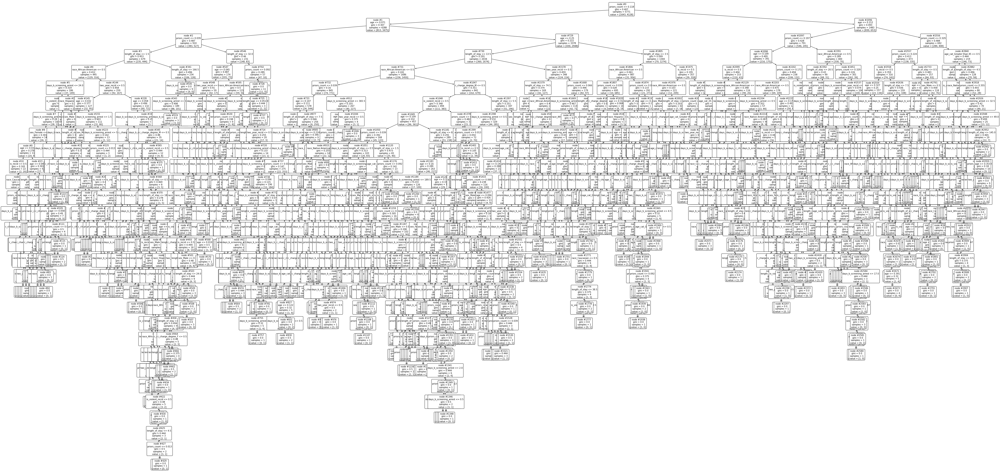

In [49]:
#### Plot the dt tree.
from sklearn import tree
import matplotlib.pyplot as plt
plt.figure(figsize=(80,40))
tree.plot_tree(models['dt'], fontsize=10, feature_names=df_info.ohe_feature_names, node_ids=True,rounded=True )
#If you need to colored the class >> filled=True


In [50]:
#### retrieve the input and cf vectors.
proto_input = input_and_cf['input'].loc[5]
proto_cf = input_and_cf['cf'].loc[5]

In [51]:
#### Present the decision path
tree_path = extract_decision_path(clf, graph, proto_input)
tree_path

[['<priors_count &le; 0.118',
  'samples = 5771',
  'value = [1643, 4128]',
  'class = Yes>'],
 ['<age &le; 0.212', 'samples = 1483', 'value = [830, 653]', 'class = No>'],
 ['<priors_count &le; 0.197',
  'samples = 791',
  'value = [546, 245]',
  'class = No>'],
 ['<age &le; 0.109', 'samples = 391', 'value = [216, 175]', 'class = No>'],
 ['<is_recid &le; 0.5', 'samples = 153', 'value = [110, 43]', 'class = No>'],
 ['<race_African-American &le; 0.5',
  'samples = 116',
  'value = [90, 26]',
  'class = No>'],
 ['<days_b_screening_arrest &le; 26.5',
  'samples = 40',
  'value = [25, 15]',
  'class = No>'],
 ['<sex_Female &le; 0.5', 'samples = 10', 'value = [9, 1]', 'class = No>'],
 ['<gini = 0.0', 'value = [7, 0]', 'class = No>']]

In [52]:
decisions, pred, leaf_id = rules.get_decision_process(np.array(proto_input).reshape(1, -1), models['dt'], df_info.ohe_feature_names)
print(leaf_id)


decision node 0 : (x [priors_count] = 0.157894737) > 0.1184210553765297)
decision node 2096 : (x [age] = 0.051282051) <= 0.21153846383094788)
decision node 2097 : (x [priors_count] = 0.157894737) <= 0.19736842066049576)
decision node 2098 : (x [age] = 0.051282051) <= 0.10897435992956161)
decision node 2099 : (x [is_recid] = 1.0) > 0.5)
decision node 2129 : (x [race_African-American] = 0.0) <= 0.5)
decision node 2130 : (x [days_b_screening_arrest] = 168.0) > 26.5)
decision node 2156 : (x [sex_Female] = 0.0) <= 0.5)
2157


In [53]:
decisions, pred, leaf_id = rules.get_decision_process(np.array(proto_cf).reshape(1, -1), models['dt'], df_info.ohe_feature_names)
print(leaf_id)

decision node 0 : (x [priors_count] = 0.0) <= 0.1184210553765297)
decision node 1 : (x [age] = 0.0) <= 0.07051282376050949)
decision node 2 : (x [priors_count] = 0.0) <= 0.03947368450462818)
decision node 3 : (x [length_of_stay] = 2.3187795) > 1.5)
decision node 341 : (x [length_of_stay] = 2.3187795) <= 166.5)
decision node 342 : (x [days_b_screening_arrest] = 4.4366584) <= 15.5)
decision node 343 : (x [days_b_screening_arrest] = 4.4366584) <= 12.5)
decision node 344 : (x [days_b_screening_arrest] = 4.4366584) > 0.5)
decision node 376 : (x [length_of_stay] = 2.3187795) <= 114.0)
decision node 377 : (x [length_of_stay] = 2.3187795) <= 51.5)
decision node 378 : (x [length_of_stay] = 2.3187795) <= 39.0)
decision node 379 : (x [length_of_stay] = 2.3187795) <= 12.5)
decision node 380 : (x [race_Other] = 0.0) <= 0.5)
decision node 381 : (x [days_b_screening_arrest] = 4.4366584) > 2.5)
decision node 475 : (x [is_violent_recid] = 0.0) <= 0.5)
decision node 476 : (x [age] = 0.0) <= 0.0448717959

In [54]:
INDX = 5
exp_type = "true_positives"
#instance = new_min_l2_instance_instance_arr

img = visualize_decision_tree_path( clf, export_decision_tree(clf, class_names, dataset_name, filepath), proto_input, INDX, 'true_positives', filepath)
img



dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.43729 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.425076 to fit



In [55]:
len(df_info.ohe_feature_names)

20

In [56]:
feature_names=df_info.ohe_feature_names
totoal_ohe_feature_names = len(feature_names)
totoal_ohe_feature_names

20

In [57]:
totoal_ohe_feature_names

20

In [58]:
feature_names

['age',
 'priors_count',
 'days_b_screening_arrest',
 'is_recid',
 'is_violent_recid',
 'two_year_recid',
 'length_of_stay',
 'age_cat_25 - 45',
 'age_cat_Greater than 45',
 'age_cat_Less than 25',
 'sex_Female',
 'sex_Male',
 'race_African-American',
 'race_Asian',
 'race_Caucasian',
 'race_Hispanic',
 'race_Native American',
 'race_Other',
 'c_charge_degree_F',
 'c_charge_degree_M']

In [59]:
#exp_type = "L2_max"
INDX = 5
#instance = instance
#exp_type = "true_positives"
#instance = new_min_l2_instance_instance_arr

img = visualize_decision_tree_path( clf,  export_decision_tree(clf, class_names, dataset_name, filepath), proto_input, INDX, 'true_positives', filepath)
img

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.43729 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.425076 to fit



In [60]:
#exp_type = "L2_max"
INDX = 5
#instance = instance
#exp_type = "true_positives"
#instance = new_min_l2_instance_instance_arr

img = visualize_decision_tree_path( clf,  export_decision_tree(clf, class_names, dataset_name, filepath), proto_cf, INDX, 'true_positives', filepath)
img

KeyboardInterrupt: 

In [61]:
from dtreeviz.trees import *
from sklearn.tree import DecisionTreeClassifier

In [62]:
# cat + numerical

proto_cf

age                        0.000000
priors_count               0.000000
days_b_screening_arrest    4.436658
is_recid                   1.000000
is_violent_recid           0.000000
two_year_recid             1.000000
length_of_stay             2.318780
age_cat_25 - 45            1.000000
age_cat_Greater than 45    0.000000
age_cat_Less than 25       0.000000
sex_Female                 1.000000
sex_Male                   0.000000
race_African-American      1.000000
race_Asian                 0.000000
race_Caucasian             0.000000
race_Hispanic              0.000000
race_Native American       0.000000
race_Other                 0.000000
c_charge_degree_F          1.000000
c_charge_degree_M          0.000000
Name: 5, dtype: float64

In [32]:
# tree_model = clf 
# x_data = X_train
# y_data = y_train
# target_name = 'target'
# feature_names=df_info.feature_names
# class_names=class_names
# X=proto_cf
# tree_index = None

# shadow_tree = ShadowDecTree.get_shadow_tree(
#     tree_model, x_data, y_data, feature_names, target_name, class_names, tree_index
# )

# shadow_tree.feature_names


In [68]:
viz = dtreeviz(clf, 
               x_data=X_train,
               y_data=y_train,
               target_name='target',
            #    feature_names=df_info.feature_names,
               feature_names=df_info.ohe_feature_names, 
               class_names=class_names,
               title="Decison Tree - COMPAS with decision path",
               #orientation="LR", 
               #X=arr,
               X=proto_cf, # B1. value not acceptable by this function.
               # scale=.3,
               max_X_features_T= 3,
               #X=X_test[0]
               
               )
viz.view()
viz

TypeError: dtreeviz() got an unexpected keyword argument 'max_X_features_T'

In [ ]:
viz.save_svg()

'/var/folders/cj/76jxqn71757384mssvb297jw0000gn/T/DTreeViz_9642.svg'